In [1]:
#from google.colab import drive
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import Flatten, Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

#drive.mount('/content/drive')

In [2]:
#os.chdir ('/content/drive/MyDrive/ML2021/aidea_aso/')
os.listdir()

['.gitignore',
 'annotation.csv',
 'train_20210106',
 'train_images',
 'keypoints_detection_aso.ipynb']

In [3]:
#!ls train_images

In [4]:
#combine new and old train data
def get_new_file_name(file_name):
  file_name = file_name.split(',')
  assert len(file_name) == 2
  return file_name[0]+"_1"+"."+file_name[1]
new_data_path = "train_20210106/"
old_data_path = "train_images/"
new_annotation_df = pd.read_csv(new_data_path+"annotation.csv")
old_annotation_df = pd.read_csv("annotation.csv")
new_annotation_df.head()

,images,x1,y1,x2,y2
0,image_0001.png,56,119,82,383
1,image_0002.png,57,132,37,378
2,image_0003.png,61,175,81,384
3,image_0004.png,53,179,32,381
4,image_0005.png,50,120,81,383


In [5]:
img = plt.imread(os.path.join("train_20210106/images/", old_annotation_df['images'][0]))
print ("images shape : "+str(img.shape))

images shape : (400, 120, 3)


In [6]:
def readfile(path,labels,df=new_annotation_df):
  # lables is the boolean variable.
  image_dir = sorted(os.listdir(path))
  x = np.zeros((len(image_dir),400,120,3), dtype=np.uint8)
  y = np.zeros((len(image_dir),4), dtype=np.uint16)
  for i,img in enumerate(image_dir):
    array = tf.keras.preprocessing.image.load_img(path+"/"+img, target_size=(400, 120, 3))
    x[i,...] = array
    if labels:
      y[i,...] = df.iloc[i,1:5].values
  if labels:
    return x,y
  else:
    return x

In [7]:
train_x_old,train_y_old = readfile(path="train_images", labels=True, df=old_annotation_df)
train_x_new,train_y_new = readfile(path="train_20210106/images/", labels=True, df=new_annotation_df)
train_x = np.concatenate((train_x_old,train_x_new), axis=0)
train_y = np.concatenate((train_y_old,train_y_new), axis=0)
x_train, x_val, y_train, y_val = train_test_split(train_x, train_y, test_size=0.2, random_state=1)
print("Size of training data = {}".format(train_x.shape))

Size of training data = (1424, 400, 120, 3)


In [8]:
print("Size of training data = {}".format(x_train.shape))

Size of training data = (1139, 400, 120, 3)


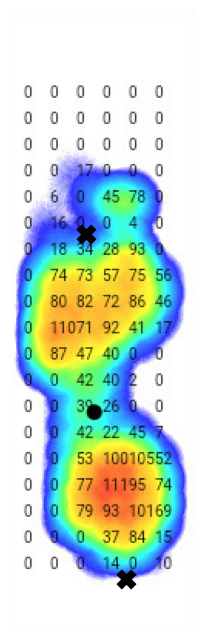

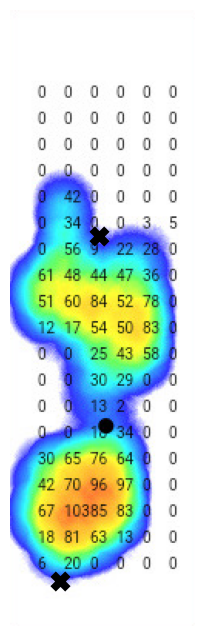

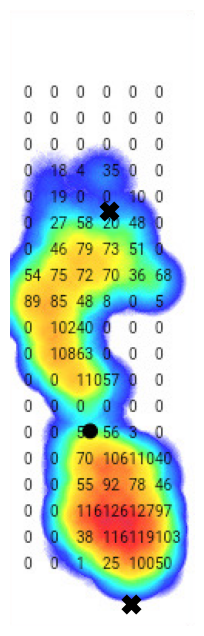

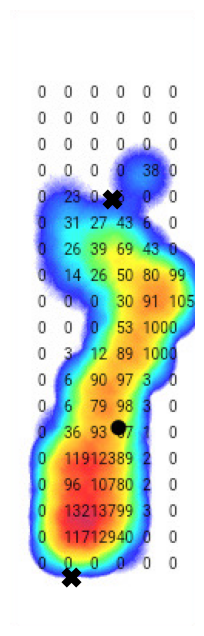

In [9]:
def get_img(images, keypoint):
  fig = plt.figure(figsize=(4,8))
  ax = fig.add_subplot(1,1,1)
  ax.imshow(images)
  ax.scatter(keypoint[0],keypoint[1],marker="x",color="black",s=15,linewidths=15)
  ax.scatter(keypoint[2],keypoint[3],marker="x",color="black",s=15,linewidths=15)
  ax.axis("off")
  plt.show()
  plt.close()
for i in range(420,424):
  img = train_x[i]
  point = train_y[i]
  get_img(img,point)

In [10]:
#source web:https://towardsdatascience.com/facial-keypoints-detection-image-and-keypoints-augmentation-6c2ea824a59
import imgaug as ia
import imgaug.augmenters as iaa
from imgaug.augmentables import Keypoint, KeypointsOnImage

def aug(im_tr, pt_tr):
  seq = iaa.Sequential(
    [iaa.Fliplr(0.5),
    iaa.Affine(rotate=5, scale=(0.9, 1.1))])
  aug_ims = []
  aug_pts = []
  coordlist = []
  for im, pt in zip(im_tr, pt_tr):
    xcoord = pt[0::2]
    ycoord = pt[1::2]
    for i in range(len(xcoord)): 
      coordlist.append(Keypoint(xcoord[i], ycoord[i]))
    kps = KeypointsOnImage(coordlist, shape=im.shape)  
    f_im, f_kp = seq(image=im, keypoints=kps)
    all_coords = []
    for k in range(len(kps.keypoints)):
      before = kps.keypoints[k]
      after = f_kp.keypoints[k]
      # print("Keypoint %d: (%.8f, %.8f) -> (%.8f, %.8f)" % (
      #     i, before.x, before.y, after.x, after.y)
      # )
      all_coords.append(after.x)
      all_coords.append(after.y)
      all_coords_arr = np.asarray(all_coords)
    aug_ims.append(im)
    aug_ims.append(f_im)
    aug_pts.append(pt)
    aug_pts.append(all_coords)
    coordlist.clear()
  return np.asarray(aug_ims), np.asarray(aug_pts)

aug_ims_train_clean_g2, aug_points_train_clean_g2 = aug(train_x, train_y)
aug_ims_train_final, aug_points_train_final = shuffle(aug_ims_train_clean_g2, aug_points_train_clean_g2)

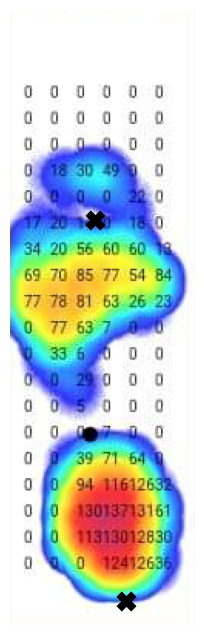

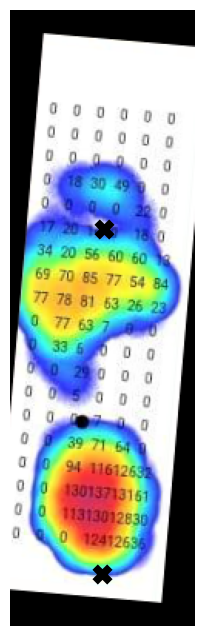

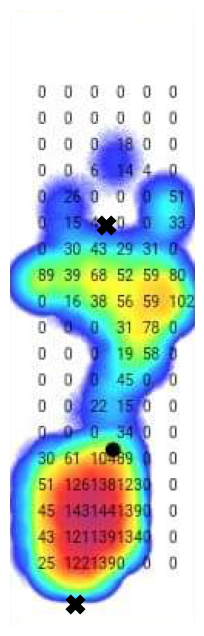

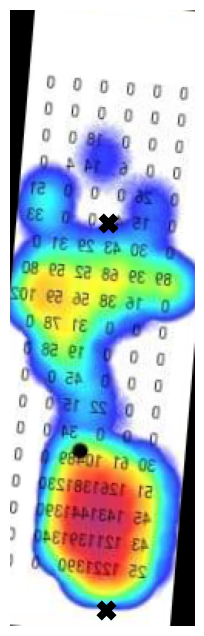

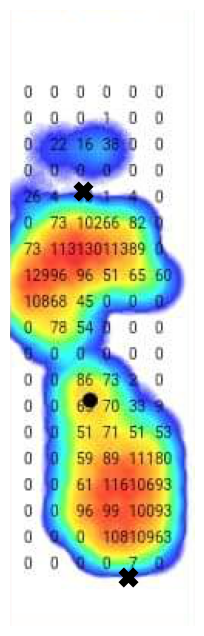

...

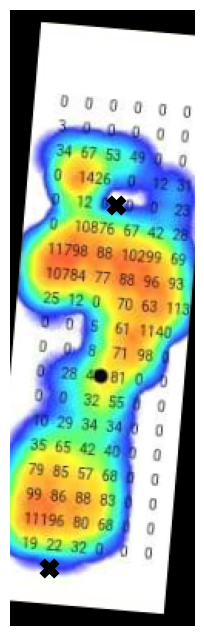

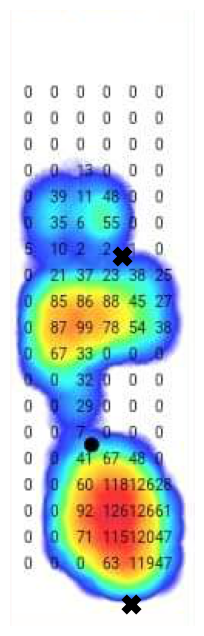

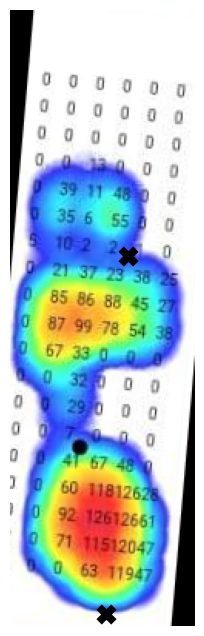

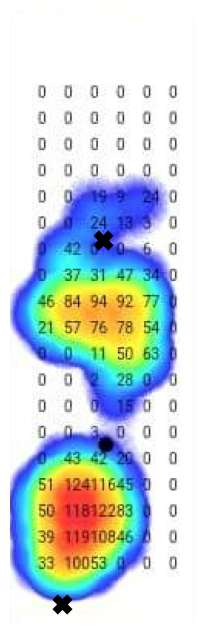

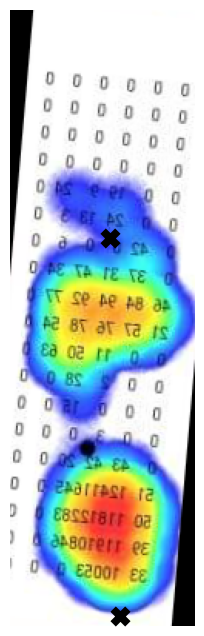

In [11]:
for i in range(0,20):
  img = aug_ims_train_clean_g2[i]
  point = aug_points_train_clean_g2[i]
  get_img(img,point)


In [12]:
image_size = (400,120)
batch_size =32
AUTOTUNE = tf.data.AUTOTUNE
train_ds = tf.data.Dataset.from_tensor_slices((aug_ims_train_final, aug_points_train_final))
val_ds = tf.data.Dataset.from_tensor_slices((x_val, y_val))

resize_and_rescale = tf.keras.Sequential([
    layers.Rescaling(1./255),
    layers.Resizing(image_size[0],image_size[1])
    ])

def prepare(ds, shuffle=False, augment=False):
  # Resize and rescale all datasets.
  ds = ds.map(lambda x, y: (resize_and_rescale(x, training=True), y), num_parallel_calls=AUTOTUNE)
  if shuffle:
    ds = ds.shuffle(1000)

  # Batch all datasets.
  ds = ds.batch(batch_size)
  
  # Use buffered prefetching on all datasets.
  return ds.prefetch(buffer_size=AUTOTUNE)


train_ds = prepare(train_ds, shuffle=True, augment=False)
val_ds= prepare(val_ds, shuffle=False, augment=False)

2022-09-06 13:13:11.383256: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-06 13:13:11.386722: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-06 13:13:11.386888: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-06 13:13:11.387977: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [16]:
#Create the base model from the pre_trained model ResNet50V2
base_model = tf.keras.applications.ResNet50V2(
    include_top=False, 
    weights='imagenet', 
    input_shape=(image_size[0],image_size[1],3))
base_model.trainable = False
base_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 400, 120, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 406, 126, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 200, 60, 64)  9472        ['conv1_pad[0][0]']              
                                                                                                  
 pool1_pad (ZeroPadding2D)      (None, 202, 62, 64)  0           ['conv1_conv[0][0]']    

In [17]:
#build model
net = tf.keras.Sequential([tf.keras.Input(shape=(image_size[0], image_size[1], 3)),
  # Add the preprocessing layers you created earlier.
  base_model,
  layers.GlobalAveragePooling2D(),
  layers.Dense(units=256,activation="relu"),
  layers.Dense(4)
  ])
net.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 13, 4, 2048)       23564800  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 256)               524544    
                                                                 
 dense_3 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 24,090,372
Trainable params: 525,572
Non-trainable params: 23,564,800
_________________________________________________________________


In [18]:
net.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 13, 4, 2048)       23564800  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 256)               524544    
                                                                 
 dense_3 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 24,090,372
Trainable params: 525,572
Non-trainable params: 23,564,800
_________________________________________________________________


In [20]:
base_learning_rate = 0.001
initial_epochs = 200
net.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
    loss="mean_squared_error",
    metrics=['mae'])
history = net.fit(
    train_ds,
    validation_data=val_ds,
    epochs=initial_epochs
    )

Epoch 1/200
89/89 [==============================] - 5s 39ms/step - loss: 127.2059 - mae: 8.5932 - val_loss: 115.6886 - val_mae: 8.1490
Epoch 2/200
89/89 [==============================] - 3s 34ms/step - loss: 111.7912 - mae: 8.0804 - val_loss: 108.7118 - val_mae: 7.9704
Epoch 3/200
89/89 [==============================] - 3s 34ms/step - loss: 103.9132 - mae: 7.8245 - val_loss: 94.0736 - val_mae: 7.4317
Epoch 4/200
89/89 [==============================] - 3s 33ms/step - loss: 95.0362 - mae: 7.4832 - val_loss: 83.2113 - val_mae: 6.9891
Epoch 5/200
89/89 [==============================] - 3s 34ms/step - loss: 91.2828 - mae: 7.3374 - val_loss: 79.7890 - val_mae: 6.8621
Epoch 6/200
89/89 [==============================] - 3s 35ms/step - loss: 85.6926 - mae: 7.1251 - val_loss: 78.6044 - val_mae: 6.8191
Epoch 7/200
89/89 [==============================] - 3s 34ms/step - loss: 81.8761 - mae: 6.9530 - val_loss: 69.5455 - val_mae: 6.4040
Epoch 8/200
89/89 [==============================] - 3s 3

In [21]:
base_model.trainable = True
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False
print("Number of layers in the base model: ", len(base_model.trainable_variables))

Number of layers in the base model:  190
Number of layers in the base model:  82


In [22]:
net.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10), 
            loss="mean_squared_error",
            metrics=['mae'])
net.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 13, 4, 2048)       23564800  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 256)               524544    
                                                                 
 dense_3 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 24,090,372
Trainable params: 21,085,444
Non-trainable params: 3,004,928
_________________________________________________________________


In [23]:
fine_tune_epochs = 50
total_epochs =  initial_epochs + fine_tune_epochs
history_fine = net.fit(
    train_ds,
    validation_data=val_ds,
    epochs=total_epochs
    ,initial_epoch=history.epoch[-1]
    )

Epoch 200/250
89/89 [==============================] - 8s 58ms/step - loss: 1469.0511 - mae: 25.2076 - val_loss: 8671.8691 - val_mae: 75.1923
Epoch 201/250
89/89 [==============================] - 5s 53ms/step - loss: 158.9468 - mae: 9.5526 - val_loss: 930.9612 - val_mae: 23.6362
Epoch 202/250
89/89 [==============================] - 5s 53ms/step - loss: 72.2624 - mae: 6.6107 - val_loss: 357.9244 - val_mae: 15.3309
Epoch 203/250
89/89 [==============================] - 5s 53ms/step - loss: 67.2362 - mae: 6.3878 - val_loss: 93.9094 - val_mae: 7.3613
Epoch 204/250
89/89 [==============================] - 5s 53ms/step - loss: 52.1974 - mae: 5.6557 - val_loss: 65.4217 - val_mae: 6.4985
Epoch 205/250
89/89 [==============================] - 5s 53ms/step - loss: 39.3034 - mae: 4.8871 - val_loss: 27.6867 - val_mae: 4.0706
Epoch 206/250
89/89 [==============================] - 5s 53ms/step - loss: 30.6920 - mae: 4.3354 - val_loss: 35.4166 - val_mae: 4.6079
Epoch 207/250
89/89 [================

In [28]:
print (history.history.keys)

<built-in method keys of dict object at 0x7f6d04455840>


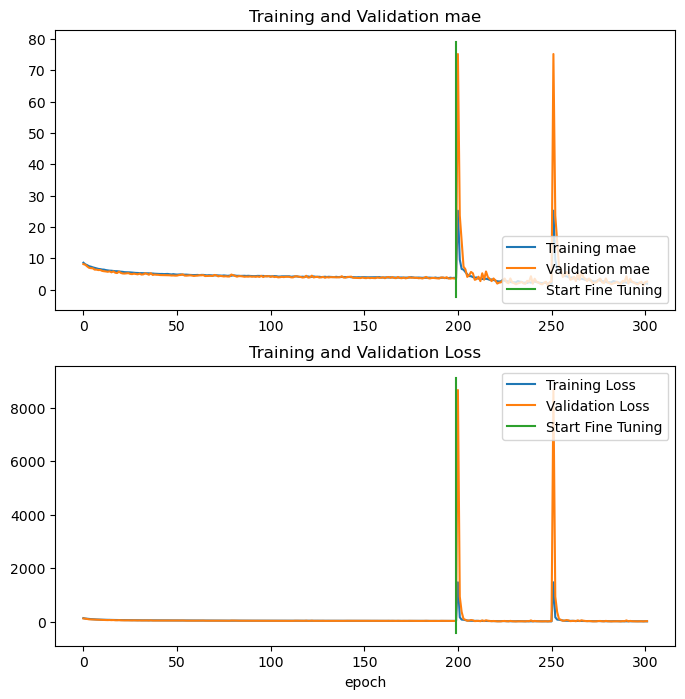

In [30]:
# 儲存訓練好的模型
net.save("WEIGHTS_FINAL.h5")
import matplotlib.pyplot as plt
mae = history.history['mae']
mae += history_fine.history['mae']
val_mae = history.history['val_mae']
val_mae += history_fine.history['val_mae']
loss = history.history['loss']
loss += history_fine.history['loss']
val_loss = history.history['val_loss']
val_loss += history_fine.history['val_loss']
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(mae, label='Training mae')
plt.plot(val_mae, label='Validation mae')
#plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation mae')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

1/1 [==============================] - 0s 461ms/step


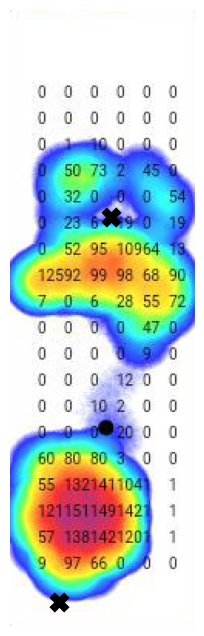

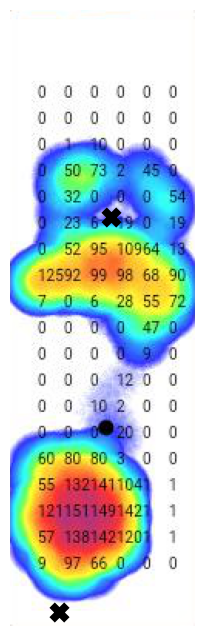

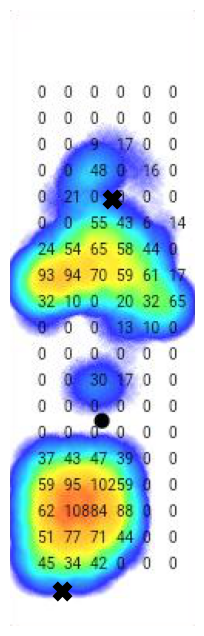

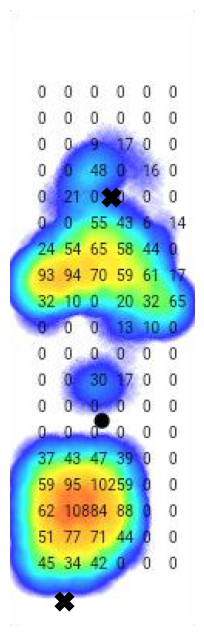

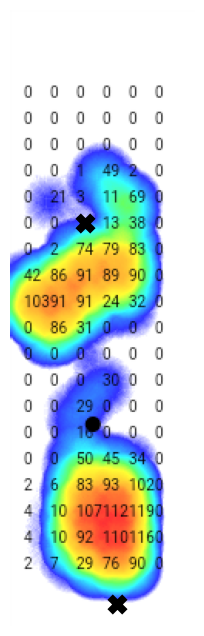

...

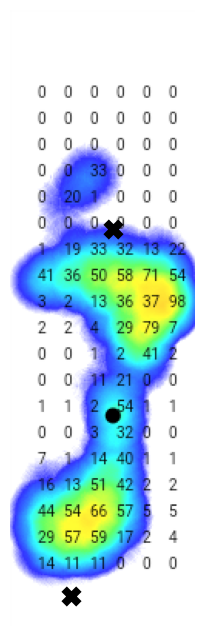

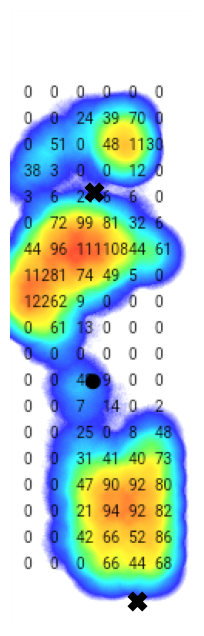

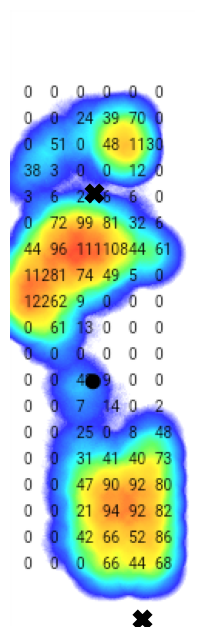

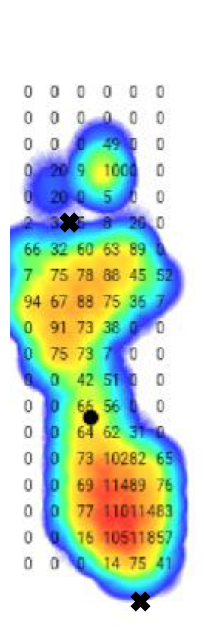

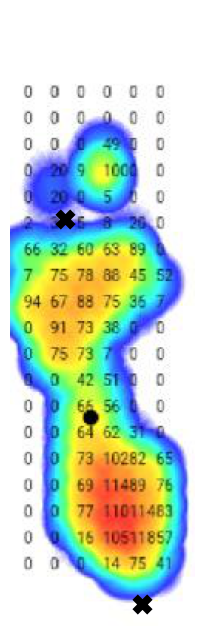

In [31]:
sample_val_images, sample_val_keypoints = next(iter(val_ds))
predictions = net.predict(sample_val_images)
for i in range(10):

  # Ground-truth
  get_img(sample_val_images[i], sample_val_keypoints[i])

  # Predictions
  get_img(sample_val_images[i], predictions[i])

In [ ]:
#!unzip -q /content/drive/MyDrive/ML2021/aidea_aso/test.zip -d /content/drive/MyDrive/ML2021/aidea_aso/


In [33]:
test_x = readfile("images",labels=False)

In [34]:
test_ds = tf.data.Dataset.from_tensor_slices((test_x,np.zeros((len(test_x),4), dtype=np.uint16)))
test_ds = prepare(test_ds, shuffle=False, augment=False)

32/32 [==============================] - 2s 36ms/step


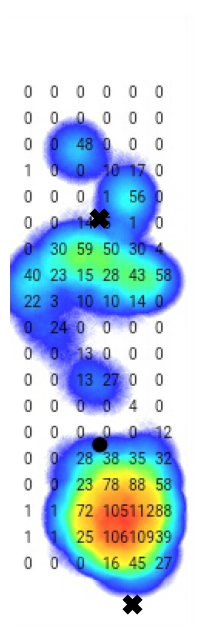

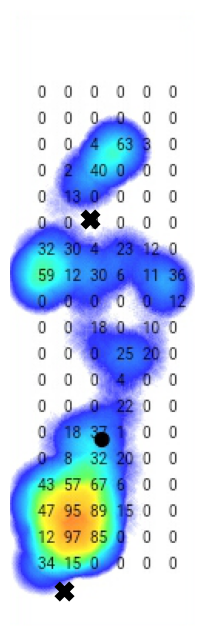

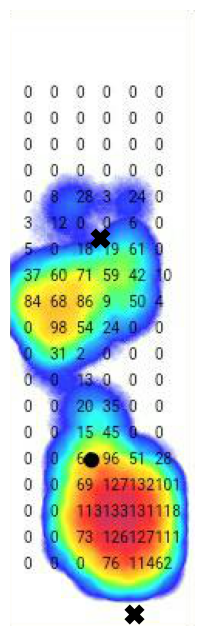

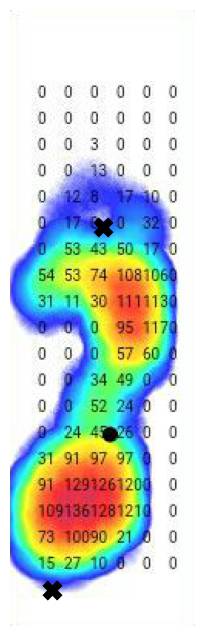

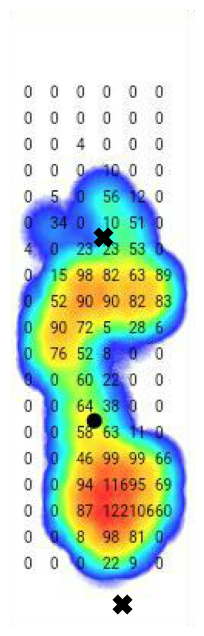

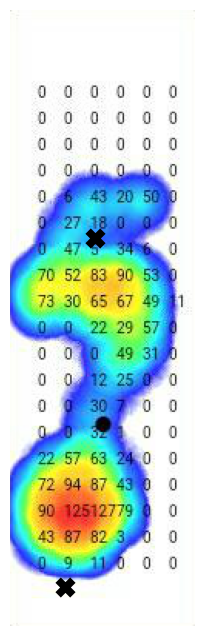

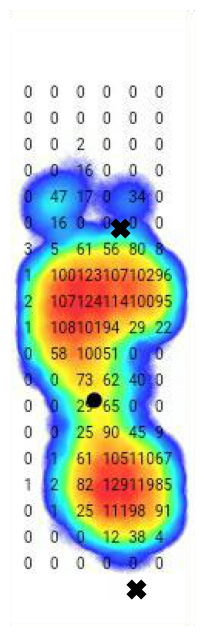

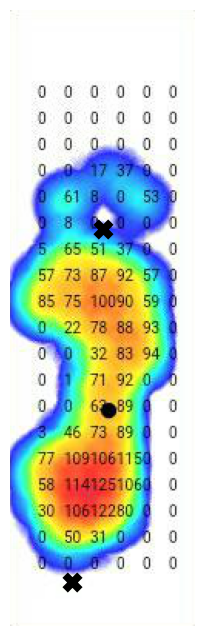

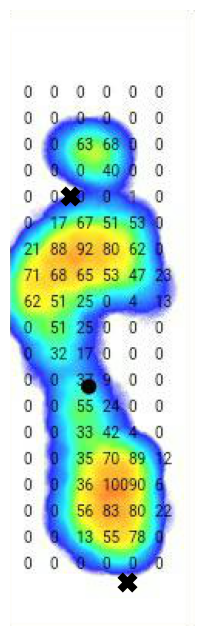

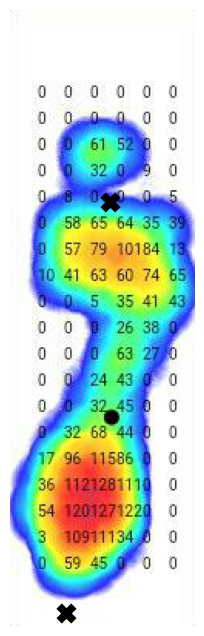

In [35]:
predictions = net.predict(test_ds)
for i in range(10):

  # Ground-truth

  # Predictions
  get_img(test_x[i], predictions[i])

In [36]:
test_file = sorted(os.listdir("images"))
with open("test_out.csv","w") as outfile:
  outfile.write("images,x1,y1,x2,y2\n")
  for i,pred in enumerate(predictions):
    name = test_file[i]
    x1 = pred[0]
    y1 = pred[1]
    x2 = pred[2]
    y2 = pred[3]
    print (name,x1,y1)
    outfile.write("{},{},{},{},{}\n".format(name,x1,y1,x2,y2))

image_0001.png 57.522396 134.6376
image_0002.png 51.292866 135.31668
image_0003.png 58.227463 147.42091
image_0004.png 60.07465 140.43663
image_0005.png 60.057 146.81151
image_0006.png 54.51969 147.8405
image_0007.png 70.900345 141.32195
image_0008.png 59.939106 141.77786
image_0009.png 38.24915 120.15195
image_0010.png 64.20091 124.1814
image_0011.png 62.069202 154.54012
image_0012.png 50.405636 146.82634
image_0013.png 58.799328 122.63527
image_0014.png 64.89426 125.576065
image_0015.png 59.939884 127.03578
image_0016.png 58.243332 132.74966
image_0017.png 53.456196 124.03787
image_0018.png 51.687115 128.4006
image_0019.png 59.72852 132.76236
image_0020.png 62.365177 144.73721
image_0021.png 63.581696 136.13774
image_0022.png 60.72317 140.55864
image_0023.png 55.133373 140.83315
image_0024.png 56.590607 130.98175
image_0025.png 59.24034 137.9664
image_0026.png 60.399242 137.67072
image_0027.png 58.65696 132.23073
image_0028.png 69.480286 128.37013
image_0029.png 52.335514 138.28224
i